# Apply Embedding on Realizing High Throughput Binding Assay Dataset with RNA Structure
## Import packages

In [3]:
import pandas as pd
import tensorflow as tf
import numpy as np
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, Normalizer, KBinsDiscretizer
from sklearn.pipeline import Pipeline, make_pipeline

## Data Preparation
### Import data

In [4]:
df = pd.read_csv("Result_Structure.csv")
df.head()

,Sequence,Structure,MFE,K,KA,RKA,Qc,sevenMer
0,GGAUCCAUUCAAAAAAAGAACGGAUCC,((((((.(((.......))).)))))),-10.5,4.971544,0.201145,0.395847,0,AAAAAAA
1,GGAUCCAUUCAAAAAACGAACGGAUCC,((((((.(((.......))).)))))),-10.5,4.514383,0.221514,0.435934,0,AAAAAAC
2,GGAUCCAUUCAAAAAAGGAACGGAUCC,((((((.(((.......))).)))))),-10.4,3.609146,0.277074,0.545273,0,AAAAAAG
3,GGAUCCAUUCAAAAAAUGAACGGAUCC,((((((.((((.....)))).)))))),-11.7,6.607685,0.151339,0.297831,0,AAAAAAU
4,GGAUCCAUUCAAAAACAGAACGGAUCC,((((((.(((.......))).)))))),-10.5,3.221327,0.310431,0.610919,0,AAAAACA


### Set a function to cut the sequence to two nucleotide window.

In [5]:
def cutWord(x, window=2):
    seq2word = []
    for i in range(13):
        seq2word.append(x[i*window:i*window+window])
    return " ".join(seq2word)

### Slice data for training and test set


In [6]:
target = df[['MFE','RKA']].copy()
sequences = df[["Sequence"]].copy()
#seq_spaced = sequences.applymap(" ".join)
seq_spaced = sequences.applymap(cutWord)

#Divide to train and test
X_train, X_test, y_train, y_test = train_test_split(seq_spaced, target, test_size=0.33, random_state=42)

#Use KBinsDiscretizer to cut continuous y data to categorical numbers.
KBD = KBinsDiscretizer(n_bins=3, encode='ordinal').fit(y_train)
y_train = KBD.transform(y_train)
y_test = KBD.transform(y_test)

#mm = make_pipeline(MinMaxScaler(), KBD())
#y_train = mm.fit_transform(y_train)
#y_test = mm.transform(y_test)

#Use seaborn to check the data
#sns.histplot(y_train)
#sns.scatterplot(x = y_train[:,0], y = y_train[:,1])

### Convert pandas dataframe to tensorflow dataset

In [7]:
#Training data
data_train = tf.data.Dataset.from_tensor_slices((X_train, y_train))
data_test = tf.data.Dataset.from_tensor_slices((X_test, y_test))
#data_tf.shuffle(60)

2022-01-10 00:43:41.795580: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


## Model Preparation
### Sequence Vectorization

In [8]:
#Text vectorize
sequence_database = tf.data.Dataset.from_tensor_slices(X_train)
vectorize_layer = tf.keras.layers.TextVectorization(max_tokens=16, output_mode='int', output_sequence_length=13, name ='vectorize_layer')
vectorize_layer.adapt(seq_spaced)

### Embedding layer

In [9]:
embedding_layer = tf.keras.layers.Embedding(input_dim=16, output_dim=2, name = 'embedding_layer')


### Create Model

In [10]:

def model_gen():
    input = tf.keras.Input(shape=(1,), dtype='string')
    x = vectorize_layer(input)
    x = embedding_layer(x)
    x = tf.keras.layers.GlobalAveragePooling1D()(x)
    x = tf.keras.layers.Dense(16, activation='relu')(x)
    output = tf.keras.layers.Dense(2)(x)

    model = tf.keras.Model(inputs=input, outputs=output)
    return(model)

In [11]:
model=model_gen()
model.compile(optimizer='adam',
              loss=tf.keras.losses.BinaryCrossentropy(),
              metrics=['accuracy'])

#Set up tensorboard callback function
tensorboard_callback = tf.keras.callbacks.TensorBoard('./logs', update_freq=1)

### Training

In [12]:
model.fit(
    data_train,
    validation_data=data_test,
    epochs=10,
    callbacks=[tensorboard_callback]
    )


Epoch 1/10
10977/10977 [==============================] - 12s 1ms/step - loss: -0.7061 - accuracy: 0.2962 - val_loss: -0.7262 - val_accuracy: 0.2901
Epoch 2/10
10977/10977 [==============================] - 10s 929us/step - loss: -0.7932 - accuracy: 0.2962 - val_loss: -0.7262 - val_accuracy: 0.2901
Epoch 3/10
10977/10977 [==============================] - 10s 935us/step - loss: -0.7932 - accuracy: 0.2962 - val_loss: -0.7262 - val_accuracy: 0.2901
Epoch 4/10
10977/10977 [==============================] - 11s 981us/step - loss: -0.7932 - accuracy: 0.2962 - val_loss: -0.7262 - val_accuracy: 0.2901
Epoch 5/10
10977/10977 [==============================] - 10s 945us/step - loss: -0.7932 - accuracy: 0.2962 - val_loss: -0.7262 - val_accuracy: 0.2901
Epoch 6/10
10977/10977 [==============================] - 10s 946us/step - loss: -0.7932 - accuracy: 0.2962 - val_loss: -0.7262 - val_accuracy: 0.2901
Epoch 7/10
10977/10977 [==============================] - 11s 959us/step - loss: -0.7932 - accur

### Extract layers from model

In [13]:
model.summary()
layer1 = model.get_layer('vectorize_layer')
layer2 = model.get_layer('embedding_layer')

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 1)]               0         
                                                                 
 vectorize_layer (TextVector  (None, 13)               0         
 ization)                                                        
                                                                 
 embedding_layer (Embedding)  (None, 13, 2)            32        
                                                                 
 global_average_pooling1d (G  (None, 2)                0         
 lobalAveragePooling1D)                                          
                                                                 
 dense (Dense)               (None, 16)                48        
                                                                 
 dense_1 (Dense)             (None, 2)                 34    

### Convert every RNA sequence into a 2D space

In [14]:
#Embedding
final_result = layer1(seq_spaced)
final_result = layer2(final_result)
final_result = final_result.numpy()

#Convert tensorflow result to pandas DataFrame
df_cp = df.copy()
for i in range(13):
    for j in range(2):
        df_cp["L"+str(i+1)+str(j+1)] = final_result[:,i,j]

df_cp.head()

,Sequence,Structure,MFE,K,KA,RKA,Qc,sevenMer,L11,L12,...,L91,L92,L101,L102,L111,L112,L121,L122,L131,L132
0,GGAUCCAUUCAAAAAAAGAACGGAUCC,((((((.(((.......))).)))))),-10.5,4.971544,0.201145,0.395847,0,AAAAAAA,-0.103066,0.102602,...,-0.132929,0.137656,-0.151566,0.150758,-0.226446,0.251465,-0.129626,0.126623,-0.146633,0.148464
1,GGAUCCAUUCAAAAAACGAACGGAUCC,((((((.(((.......))).)))))),-10.5,4.514383,0.221514,0.435934,0,AAAAAAC,-0.103066,0.102602,...,-0.226446,0.251465,-0.151566,0.150758,-0.226446,0.251465,-0.129626,0.126623,-0.146633,0.148464
2,GGAUCCAUUCAAAAAAGGAACGGAUCC,((((((.(((.......))).)))))),-10.4,3.609146,0.277074,0.545273,0,AAAAAAG,-0.103066,0.102602,...,-0.103066,0.102602,-0.151566,0.150758,-0.226446,0.251465,-0.129626,0.126623,-0.146633,0.148464
3,GGAUCCAUUCAAAAAAUGAACGGAUCC,((((((.((((.....)))).)))))),-11.7,6.607685,0.151339,0.297831,0,AAAAAAU,-0.103066,0.102602,...,0.002379,-0.050908,-0.151566,0.150758,-0.226446,0.251465,-0.129626,0.126623,-0.146633,0.148464
4,GGAUCCAUUCAAAAACAGAACGGAUCC,((((((.(((.......))).)))))),-10.5,3.221327,0.310431,0.610919,0,AAAAACA,-0.103066,0.102602,...,-0.132929,0.137656,-0.151566,0.150758,-0.226446,0.251465,-0.129626,0.126623,-0.146633,0.148464


## Data Visualozation by plotly
### 3D plot with 8th and 9th two nucleotides with relative binding ability (Relative association constant) 

In [15]:
import plotly.express as px
df = df_cp
fig = px.scatter_3d(df, x='L81', y='L91', z='RKA', color='MFE',
                   custom_data=['sevenMer', 'RKA', 'MFE'])
#set hover
fig.update_traces(
    hovertemplate = "<br>".join([
    "Seq: %{customdata[0]}",
    "RKA: %{customdata[1]}",
    "MFE: %{customdata[2]}"])
)

fig.show()

### Use seaborn to show the 9th two nucleotide and binding ability

<AxesSubplot:xlabel='L91', ylabel='RKA'>

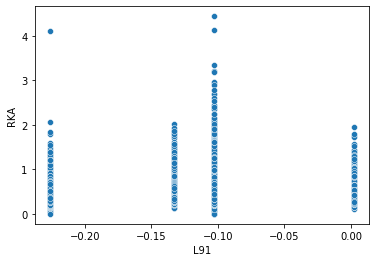

In [16]:
sns.scatterplot(data=df_cp, x='L91', y='RKA')

## Apply t-SNE to visualize the groups

### Implement t-SNE by sklearn
Here to set t-SNE, the parameter, perplexity, is very critical and is recommended in range of 5 to 50. It can affect the grouping result.

In [17]:
from sklearn.manifold import TSNE

#data for t-SNE
df_tsne = df_cp.copy()
df_tsne = df_tsne.drop(["Sequence", "Structure", "K", "KA", "Qc", "sevenMer"], axis = 1)
X_embedded = TSNE(n_components=2, learning_rate='auto', init='random', perplexity=50).fit_transform(df_tsne)

### Convert t-SNE result to padnas DataFrame in order to perform data visualization

In [18]:
labels = KBD.transform(target)
df_tsne["X"] = X_embedded[:,0]
df_tsne["Y"] = X_embedded[:,1]
df_tsne["sequence"] = df.sevenMer

df_tsne["MFE_Label"] = labels[:,0]
df_tsne["RKA_Label"] = labels[:,1]
df_tsne.head()

,MFE,RKA,L11,L12,L21,L22,L31,L32,L41,L42,...,L112,L121,L122,L131,L132,X,Y,sequence,MFE_Label,RKA_Label
0,-10.5,0.395847,-0.103066,0.102602,-0.126231,0.212669,-0.162617,0.228823,-0.126231,0.212669,...,0.251465,-0.129626,0.126623,-0.146633,0.148464,48.274475,-6.287695,AAAAAAA,2.0,0.0
1,-10.5,0.435934,-0.103066,0.102602,-0.126231,0.212669,-0.162617,0.228823,-0.126231,0.212669,...,0.251465,-0.129626,0.126623,-0.146633,0.148464,-6.607460,-55.002708,AAAAAAC,2.0,1.0
2,-10.4,0.545273,-0.103066,0.102602,-0.126231,0.212669,-0.162617,0.228823,-0.126231,0.212669,...,0.251465,-0.129626,0.126623,-0.146633,0.148464,32.440956,-13.547824,AAAAAAG,2.0,1.0
3,-11.7,0.297831,-0.103066,0.102602,-0.126231,0.212669,-0.162617,0.228823,-0.126231,0.212669,...,0.251465,-0.129626,0.126623,-0.146633,0.148464,23.297619,25.556690,AAAAAAU,0.0,0.0
4,-10.5,0.610919,-0.103066,0.102602,-0.126231,0.212669,-0.162617,0.228823,-0.126231,0.212669,...,0.251465,-0.129626,0.126623,-0.146633,0.148464,50.922443,-13.141927,AAAAACA,2.0,2.0


### 2D data visualization

In [19]:
import plotly.express as px
df = df_cp
fig = px.scatter(df_tsne, x='X', y='Y', color = "MFE_Label", size = 'RKA', size_max=20,
                    custom_data=['RKA', 'sequence'])
                    
#set hover
fig.update_traces(
    hovertemplate = "<br>".join([
    "Seq: %{customdata[1]}",
    "RKA: %{customdata[0]}"])
)
fig.show()

### 2D t-SNE result with association affinity in z axis

In [20]:
import plotly.express as px
df = df_cp
fig = px.scatter_3d(df_tsne, x='X', y='Y', z = "RKA", color = 'MFE_Label',
                 custom_data=['RKA', 'sequence'])
#set hover
fig.update_traces(
    hovertemplate = "<br>".join([
    "Seq: %{customdata[0]}",
    "RKA: %{customdata[1]}",
    "MFE: %{customdata[2]}"])
)

### 3D t-SNE Demo

In [21]:
df_key = df_cp[["MFE","RKA","L71", "L81", "L91"]] 
X_embedded = TSNE(n_components=3, learning_rate='auto', init='random', perplexity=50).fit_transform(df_key)
df_visual = pd.DataFrame(X_embedded)
df_visual.head()

,0,1,2
0,6.084613,-9.930842,-15.814926
1,5.101150,-10.010793,-4.452199
2,-16.725597,4.755771,-19.127640
3,1.758290,-2.224187,23.436592
4,0.503330,-12.898030,-13.229083


### Preparation for data visualization

In [22]:
df_visual["RKA"] = df_key.RKA
df_visual["sequence"] = df.sevenMer
df_visual.columns = ["x", "y", "z", "RKA","sequence"]
df_visual.head()

,x,y,z,RKA,sequence
0,6.084613,-9.930842,-15.814926,0.395847,AAAAAAA
1,5.101150,-10.010793,-4.452199,0.435934,AAAAAAC
2,-16.725597,4.755771,-19.127640,0.545273,AAAAAAG
3,1.758290,-2.224187,23.436592,0.297831,AAAAAAU
4,0.503330,-12.898030,-13.229083,0.610919,AAAAACA


### Visualize data by 3D scatter plot in plotly

In [25]:
import plotly.express as px
df = df_cp
fig = px.scatter_3d(df_visual, x='x', y='y', z='z', color = "RKA", size_max=15,
                    custom_data=['RKA', 'sequence'])
                    
#set hover
fig.update_traces(
    hovertemplate = "<br>".join([
    "Seq: %{customdata[1]}",
    "RKA: %{customdata[0]}"])
)
fig.show()